In [3]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

seed=42


import os
import plotly.express as px
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid


import torch
import torch.nn as nn
import torch.nn.functional as F
if torch.cuda.is_available():
    print("Yeah we have a GPU!")
dev = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
import torchvision
import torchvision.transforms as transforms
import torch.optim as optim

import numpy as np
from scipy.spatial import distance_matrix

from gdeep.decision_boundary.decision_boundary_calculator import *
from gdeep.create_nets.sample_nn import SampleCNN_MNIST_SAMPLE,\
    SampleCNN_MNIST_SAMPLE_2
from gdeep.create_nets import Net
from gdeep.plotting.visualize_hd_db import LowDimensionalPlane

try:
    from color_scale import lab_color_scale
except:
    pass

<style>
r { color: Red }
o { color: Orange }
g { color: Green }
</style>
# Setting up CNN and train on MINIST_0_1

We train a simple CNN on MNIST consisting only of the classes "0" and "1".

In [3]:
# Setting up train and test loader

batch_size = 64

transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.1307,), (0.3081,))])

# Train set
trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                        download=True, transform=transform)

# Filters for labels 0 and 1
trainset_0_1 = torch.utils.data.Subset(trainset, torch.stack((trainset.targets == 0, trainset.targets == 1), axis=-1).any(-1).nonzero()[:,0])

trainloader = torch.utils.data.DataLoader(trainset_0_1, batch_size=batch_size,
                                          shuffle=True, num_workers=2,
                                          pin_memory=True)


# Test set
testset = torchvision.datasets.MNIST(root='./data', train=False,
                                       download=True, transform=transform)
# Filters for labels 0 and 1
testset_0_1 = torch.utils.data.Subset(testset, torch.stack((testset.targets == 0, testset.targets == 1), axis=-1).any(-1).nonzero()[:,0])
testloader = torch.utils.data.DataLoader(testset_0_1, batch_size=batch_size,
                                         shuffle=False, num_workers=2,
                                         pin_memory=True)

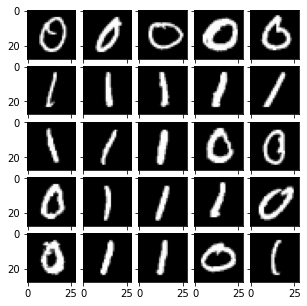

In [4]:
# Plot sample training images

first_train_batch= list(trainloader)[0][0].squeeze(1)

fig = plt.figure(figsize=(5., 5.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(5, 5),  # creates 5x5 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for ax, im in zip(grid, [im for im in first_train_batch[:5*5]]):
    # Iterating over the grid returns the Axes.
    ax.imshow(im, cmap='gray')
plt.title('Sample training images')
plt.show()

In [5]:
# Initialize neural network with smooth activation function ELU
# in order to get non-trivial higher differentials

digit_detect_nn = SampleCNN_MNIST_SAMPLE(smooth=True).to(dev)

print('Neural network architecture')
print(digit_detect_nn)


print("Trainable parameters of NN:",\
    sum(p.numel() for p in digit_detect_nn.parameters()), '\n')

Neural network architecture
SampleCNN_MNIST_SAMPLE(
  (conv1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=400, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=2, bias=True)
)
Trainable parameters of NN: 61026 



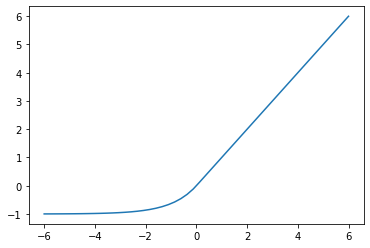

In [82]:
# Plotting ELU activation function
elu_act = nn.ELU()
x = torch.linspace(-6, 6, 50)
y = elu_act(x)

plt.plot(x, y)
plt.show()

In [166]:
n_epoch = 50

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(digit_detect_nn.parameters(), lr=0.001, momentum=0.9)
#optimizer = optim.Adam(digit_detect_nn.parameters(), lr=0.001)


for epoch in range(n_epoch):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(dev)
        labels = labels.to(dev)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = digit_detect_nn(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 20 == 19:    # print every 2000 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 20))
            running_loss = 0.0

print('Finished Training')

[1,    20] loss: 0.668
[1,    40] loss: 0.512
[1,    60] loss: 0.278
[1,    80] loss: 0.108
[1,   100] loss: 0.051
[1,   120] loss: 0.031
[1,   140] loss: 0.026
[1,   160] loss: 0.019
[1,   180] loss: 0.021
[2,    20] loss: 0.020
[2,    40] loss: 0.017
[2,    60] loss: 0.009
[2,    80] loss: 0.014
[2,   100] loss: 0.015
[2,   120] loss: 0.010
[2,   140] loss: 0.013
[2,   160] loss: 0.010
[2,   180] loss: 0.013
[3,    20] loss: 0.011
[3,    40] loss: 0.008
[3,    60] loss: 0.009
[3,    80] loss: 0.014
[3,   100] loss: 0.007
[3,   120] loss: 0.010
[3,   140] loss: 0.008
[3,   160] loss: 0.014
[3,   180] loss: 0.009
[4,    20] loss: 0.003
[4,    40] loss: 0.010
[4,    60] loss: 0.005
[4,    80] loss: 0.013
[4,   100] loss: 0.012
[4,   120] loss: 0.007
[4,   140] loss: 0.008
[4,   160] loss: 0.005
[4,   180] loss: 0.008
[5,    20] loss: 0.006
[5,    40] loss: 0.007
[5,    60] loss: 0.008
[5,    80] loss: 0.005
[5,   100] loss: 0.006
[5,   120] loss: 0.006
[5,   140] loss: 0.007
[5,   160] 

In [8]:
for param in digit_detect_nn.parameters():
            param.requires_grad = False
model = lambda x: F.softmax(digit_detect_nn(x), dim=-1)[:, 1] - torch.tensor([0.5])

In [167]:
correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data
        images = images.to(dev)
        labels = labels.to(dev)
        outputs = digit_detect_nn(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the 10000 test images: %f %%' % (
    100. * correct / total))

Accuracy of the network on the 10000 test images: 99.905437 %


# Sampling points on the decsion boundary

using gradient flow method


In [9]:
steps = 1000

trajectory = []

dc_samples = {'spatial': [], 'gradients': []}

batch_num = 0
labels = []
for initial_points_batch, label in iter(testloader):
    initial_points_batch.to(dev, non_blocking=True)
    labels.append(label)
    g = GradientFlowDecisionBoundaryCalculator(
                model=model,
                initial_points=initial_points_batch,
                optimizer=lambda params: torch.optim.Adam(params)
    )

    for step in range(steps):
        g.step()
        trajectory.append(g.get_decision_boundary().clone().detach()[:10])

    y = g.get_decision_boundary()
    delta = torch.zeros_like(y, requires_grad=True)
    loss = torch.sum(model(y+delta))
    loss.backward()
    dc_samples['gradients'].append(delta.grad.detach())

    dc_samples['spatial'].append(y.detach().cpu())

    batch_num +=1
    if batch_num > 0:
        break

In [10]:
dc_samples_tensor = {'spatial': [], 'gradients': []}
dc_samples_tensor['spatial'] = torch.cat(dc_samples['spatial'], axis=0)
dc_samples_tensor['gradients'] = torch.cat(dc_samples['gradients'], axis=0).reshape([-1, 28*28])
dc_samples_tensor['normal'] = dc_samples_tensor['gradients'] / dc_samples_tensor['gradients'].norm(dim=1)[:, None]

In [87]:
# l_2 distance of start to end point of the gradient flow

init_pt_batch = []
for initial_points_batch, _ in iter(testloader):
    init_pt_batch.append(initial_points_batch)

init_pt_tensor = torch.cat(init_pt_batch, axis=0)[:dc_samples_tensor['spatial'].shape[0]]
init_pt_tensor_flat = init_pt_tensor.reshape(-1, 28*28)

dc_samples_tensor_flat = dc_samples_tensor['spatial'].reshape(-1, 28*28)

approx_dist_db = torch.sqrt(torch.sum((init_pt_tensor_flat - dc_samples_tensor_flat)**2, 1))
px.histogram(approx_dist_db, title='l_2 distance of start to end point of the gradient flow')

<r> Adversarial examples are far from the original input images. </r>

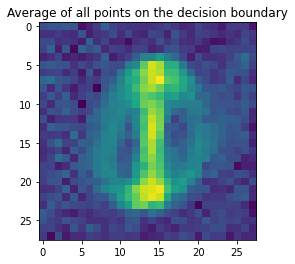

In [88]:
plt.imshow(dc_samples_tensor['spatial'].mean(0)[0,:,:])
plt.title("Average of all points on the decision boundary")
plt.show()

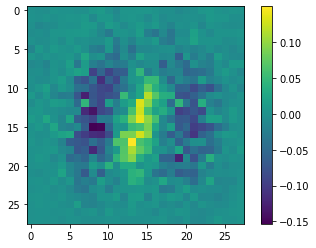

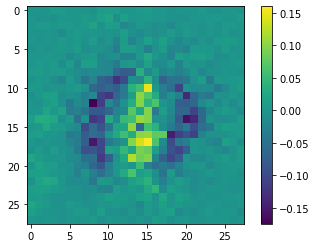

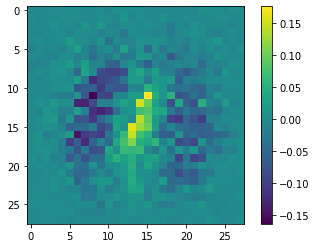

In [89]:
for i in range(3):
    plt.imshow(dc_samples_tensor['normal'][i,:].reshape(28, 28))
    plt.colorbar()
    plt.show()

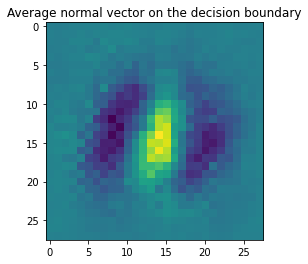

In [90]:
plt.imshow(dc_samples_tensor['normal'].mean(0).reshape((28, 28)))
plt.title("Average normal vector on the decision boundary")
plt.show()

In [184]:
# Plot histogram of cosine similarity of points on the decision boundary

dc_samples_normal = dc_samples_tensor['normal'][:50]

res = torch.mm(dc_samples_normal, dc_samples_normal.transpose(0,1))

fig = px.histogram(res.reshape(-1))
fig.update_layout(title_text='Cosine similarity of normal vectors on DB')
fig.show()

In [150]:
np.arccos(0.65)*180./np.pi

49.45839812649548

Hence <r> **normal vectors are highly correlated** </r> since random unit vectors in high dimensional space are almost orthorgonal with high probabilty.

In [92]:
# Average NN distance of sampled points on DB

dc_spatial_flatten = dc_samples_tensor['spatial'].reshape((-1, 28 * 28))

avg_nn_dist = np.amin(distance_matrix(dc_spatial_flatten, dc_spactial_flatten) + np.diag([np.inf] * dc_spatial_flatten.shape[0]), axis=0).mean()

print(f'Average nearest neighbor distance of sampled points on DB: {avg_nn_dist}')

Average nearest neighbor distance of sampled points on DB: 19.630244549846005


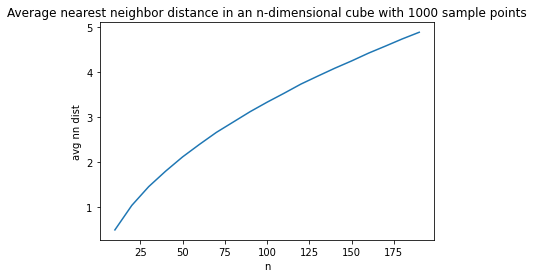

In [93]:
N = 1000 # number of sample points
n_range = range(10, 200, 10) # cube dimension
avg_nn_dist = []
for n in n_range:
    sample_points_cube = np.random.uniform(0.,1., (N, n))
    distance_cube = distance_matrix(sample_points_cube, sample_points_cube)
    avg_nn_dist.append(np.amin(distance_cube + np.diag([np.inf] * N), axis=0).mean())
plt.plot(n_range, avg_nn_dist)
plt.title(f'Average nearest neighbor distance in an n-dimensional cube with {N} sample points')
plt.xlabel('n')
plt.ylabel('avg nn dist')
plt.show()

In [17]:
n = 13
N_range = [2**i for i in range(1, 15)]
avg_nn_dists = []

for N in N_range:
    sample_points_cube = np.random.uniform(0.,1., (N, n))
    distance_cube = distance_matrix(sample_points_cube, sample_points_cube)
    avg_nn_dists.append(np.amin(distance_cube + np.diag([np.inf] * N), axis=0).mean())

print('num_points \t avg_nn_dist')
avg_nn_dist_list = []
for N, avg_nn_dist in zip(N_range, avg_nn_dists):
    print(N, '\t', avg_nn_dist)
    avg_nn_dist_list.append(avg_nn_dist)

num_points 	 avg_nn_dist
2 	 1.307714353081524
4 	 1.428504693394723
8 	 1.148883143692296
16 	 1.0827438384657035
32 	 0.9914729216878467
64 	 0.9003134899800215
128 	 0.8383634073174822
256 	 0.7778882118526924
512 	 0.7288019479592788
1024 	 0.6829086702132395
2048 	 0.6410674059253978
4096 	 0.5984257326475643
8192 	 0.5621744428840436
16384 	 0.5287336683006206


2.4732950282598622

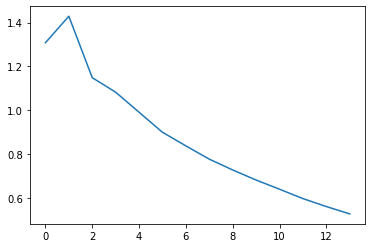

In [18]:
plt.plot(avg_nn_dist_list)
avg_nn_dist_list[0]/avg_nn_dist_list[-1]

**Conclusion:** The nearest neighbor distance has the complexity $O(\sqrt{n})$ and are exponential in the number of points $N$.

<r> ** Sampled points on the decision boundary are far from each other.** </r>

This is called **Curse of dimensionality**.

# Curvature analysis of the decision boundary


![alt text](images/def_curv.png)



The curvature in direction $v$ is the curvature of the curve resulting from the intersection of the manifold with the plane spanned by $v$ and the normal vector $\nabla F(x)/\|\nabla F(x)\|_2$.

This can be expressed in terms of the Hessian:
$$\kappa(z, v) = \frac{v^T H v}{\|v\|_2^2 \|\nabla F(z)\|_2}.$$

The principal curvatures are the eigenvalues of
$\frac 1 {\|\nabla F(z)\|_2} PHP$
where $P = I - \nabla F(z) \nabla F(z)^T$ is the projection on the tangent space.


In [159]:
def compute_principal_curvatures(model, x, gradient):
    assert x.shape == torch.Size([1, 28, 28])
    x = x.reshape((1, 1, 28, 28))
    n = 28 * 28
    gradient = gradient.reshape(28 * 28)
    normal_gradient = gradient / torch.norm(gradient)
    f_nn = lambda x: model(x)[0]

    hessian = torch.autograd.functional.hessian(f_nn, x).reshape(28*28, 28*28)
    x_flat = x.reshape(28*28)

    projection_tangent = torch.eye(n) - torch.einsum('i,j->ij', normal_gradient, normal_gradient)
    curvature_matrix = (projection_tangent @ hessian @ projection_tangent)/torch.norm(gradient)
    principal = torch.symeig(curvature_matrix, eigenvectors=True)
    principal_curvatures = principal.eigenvalues
    principal_directions = principal.eigenvectors
    return principal_curvatures, principal_directions, curvature_matrix

In [174]:
i = 1
x = dc_samples_tensor['spatial'][i].reshape((1,28,28))
gradient = dc_samples_tensor['gradients'][i].reshape((1,1,28,28))

principal_curvatures, principal_directions, curvature_matrix = compute_principal_curvatures(model, x, gradient)


px.histogram(principal_curvatures)

The distribution of the curvature is slighlty tilted to the left.
<r> ** The decision boundary is very flat.** </r>

Hence there is no non-trivial topology locally.

In [175]:
point = i

x = dc_samples_tensor['spatial'][point].reshape((1, 28, 28))
gradient = dc_samples_tensor['gradients'][point].reshape((1,28,28))
normal = dc_samples_tensor['normal'][point].reshape((1,28,28))

principal_curvatures, principal_directions, curvature_matrix = compute_principal_curvatures(model, x, gradient)

v1 = normal
v2 = principal_directions[:, 0].reshape((1,28,28))

v = torch.stack((v1,v2))

plane = LowDimensionalPlane(x, v)

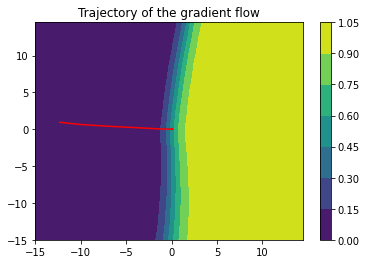

In [177]:
x_range = 15.
y_range = x_range
delta = 0.5
grid_x, grid_y = torch.meshgrid(torch.arange(-x_range, x_range, delta), torch.arange(-y_range, y_range, delta))
grid = torch.stack((grid_x.reshape(-1), grid_y.reshape(-1)), dim=1)
model_val = model(plane.embed_tensor(grid)).reshape(grid_x.shape)

trajectory_tensor = torch.stack(trajectory)
trajectory_tensor_proj = plane.project_tensor(trajectory_tensor[:, i, : , :, :])

plt.contourf(grid_x, grid_y, model_val.detach())
plt.colorbar()
plt.plot(trajectory_tensor_proj[:, 0], trajectory_tensor_proj[:, 1], c='r')
plt.title('Trajectory of the gradient flow')
plt.show()

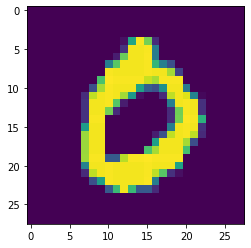

In [99]:
plt.imshow(trajectory_tensor[0, i, 0 , :, :])
plt.show()

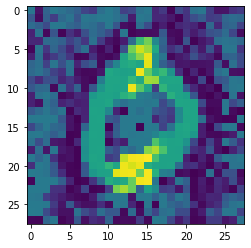

In [100]:
plt.imshow(trajectory_tensor[-1, i, 0 , :, :])
plt.show()

<r> This is once again the *Lasange effect*. </r>

This is used in

*Fawzi, A., Moosavi-Dezfooli, S. M., Frossard, P., & Soatto, S. (2018). Empirical Study of the Topology and Geometry of Deep Networks. Proceedings of the IEEE Computer Society Conference on Computer Vision and Pattern Recognition, 3762–3770. https://doi.org/10.1109/CVPR.2018.00396*

to reconstruct the original label of an adversarial example.

<r> The points on the decision boundary computed by the gradient flow method are biased in the sense that the decision boundary is bent in the direction of the original image. </r>

## Taylor expansion for robustness estimate

**Second order Taylor expansion**
$$f_\theta(x+\Delta x) = f_\theta(x) + \nabla f_\theta(x)\Delta x + \frac 12 \Delta x^T H \Delta x$$

The robustness of $f_\theta$ in $x$ given as the supremum all $\delta$ such that
$$\mathrm{sign} f_\theta(x+\Delta x) - 0.5 = \mathrm{sign} f_\theta(x) - 0.5 $$
for all $\|\Delta x\| < \delta$.

<r> Hence the robustness can be estimated in terms of $J$ and the absolute values of the eigenvalues of $H$. </r>

*Yu, F., Liu, C., Wang, Y., Zhao, L., & Chen, X. (2018). Interpreting Adversarial Robustness: a View From Decision Surface in Input Space. ArXiv, 1–15.*

# Hypothesis: The decision boundary of a CNN is highly connected.

*Fawazi* et al showed that the classification region are connected hence the <r> decision boundary is also connected. </r>

### Visualize the decision boundary using sections of planes

In [1]:
import plotly.graph_objects as go

def plot_section_2d(idxs, random=False, show=True):
    if random:
        assert len(idxs) == 2, 'idxs list has be have length 3'
        x = torch.rand((1, 28, 28))
    else:
        assert len(idxs) == 3, 'idxs list has be have length 3'
        x = dc_samples_tensor['spatial'][idxs[2]]
    v1 = dc_samples_tensor['spatial'][idxs[0]] - x
    v2 = dc_samples_tensor['spatial'][idxs[1]] - x
    v = torch.stack((v1, v2))

    plane = LowDimensionalPlane(x, v)

    rang_plot = 5.
    a, b = np.mgrid[-rang_plot:rang_plot:50j, -rang_plot:rang_plot:50j]
    coords = np.stack((a, b))
    coords_tensor = torch.tensor(coords, dtype=torch.float32).reshape(2, -1)
    values = model(plane.embed_tensor(coords_tensor.transpose(1,0))).detach().numpy().reshape(a.shape)

    trace_1  = go.Contour(
            z=values,
            x=np.linspace(-rang_plot, rang_plot,50),
            y=np.linspace(-rang_plot, rang_plot,50)
        )

    edge_points = torch.tensor([[0.,0.], [0., 1.], [1., 0.],[0.,0.]])
    trace_2 = go.Scatter(x=edge_points[:, 0], y=edge_points[:, 1], marker_color='rgba(255, 182, 193, .9)')

    fig = go.FigureWidget([trace_1, trace_2])
    fig['layout']['yaxis']['scaleanchor']='x'
    if show:
        fig.show()
    else:
        return fig
for i in range(5):
    for j in range(5):
        fig = plot_section_2d([3*i, 3*i+1], random=True, show=False)
        fig.write_image('plots/connected_components_analysis/fig{0:0=3d}--{0:0=3d}.jpg'.format(i, j))
        del fig

NameError: name 'torch' is not defined

The intersection of the decision boundary with a 2 dimensional plane is generically connected.

<r> We can hence check connectivity in low dimensions by using PH or other approaches.</r>

We hence get rid of the curse of dimensionality.

In [102]:
import plotly.graph_objects as go
def plot_section_3d(idxs, random = False):
    if random:
        assert len(idxs) == 3, 'idxs list have to be of length 3'
        x = torch.rand((1, 28, 28))
    else:
        assert len(idxs) == 4, 'idxs list have to be of length 4'ave the debt
        x = dc_samples_tensor['spatial'][idxs[3]]ave the debt
    v1 = dc_samples_tensor['spatial'][idxs[0]] - xave the debt
    v2 = dc_samples_tensor['spatial'][idxs[1]] - x
    v3 = dc_samples_tensor['spatial'][idxs[2]] - x
    v = torch.stack((v1, v2, v3))

    plane_3d = LowDimensionalPlane(x, v)

    n_delta = 30
    t = np.linspace(-2.5, 2.5, n_delta)
    x, y, z = np.meshgrid(t,t,t)
    values = model(plane_3d.embed_tensor(torch.tensor(np.stack((x.reshape(-1), y.reshape(-1), z.reshape(-1)), -1), dtype=torch.float32))).reshape(n_delta, n_delta, n_delta)

    
    trace_1 = go.Isosurface(
        x = x.flatten(),
        y = y.flatten(),
        z = z.flatten(),
        value=values.flatten(),
        isomin=0.5,
        isomax=0.5)
    edge_points = np.array([[0.,0.,0.], [0., 1.,0.], [1., 0.,0.],[0.,0.,1.]])
    trace_2 = go.Scatter3d(x=edge_points[:,0], y=edge_points[:,1], z=edge_points[:,2],mode='markers')
    
    fig = go.FigureWidget([trace_1, trace_2])
    fig.show()

In [120]:
plot_section_3d([10, 11, 12], random = True)

In [119]:
for i in range(3,4):
    plot_section_3d([4*i+0, 4*i+1, 4*i+2, 4*i+3])

### Varifying that the decision boundary is simply connected

![alt text](images/highly_connected.png)


Idea: Choose a the 3d-plance such that the intersection with the decision boundary is simply connected.

If not add another dimension to make it simply connected.



**Problems**
* Becomes computationally intensive for higher homotopy groups
* Not clear if that is the right way to sample a closed curve.

  **Curvature estimate for non-trivial topology**

  Idea: There is no non-trivial topology on a verywhere almost flat manifold in range $1/{\max\{pc\}}$.

  ![alt text](images/curvature_circle.png)


In [75]:
dc_spatial_flatten = dc_samples_tensor['spatial'].flatten(1)

max_dist_db = distance_matrix(dc_spatial_flatten, dc_spatial_flatten).max()
print('maximal distance of sampled points on DB: {:f}'.format(max_dist_db))

maximal distance of sampled points on DB: 42.433268


In [127]:
min_pc = 0
max_pc = 0
for i in range(64):
    x = dc_samples_tensor['spatial'][i].reshape((1,28,28))
    gradient = dc_samples_tensor['gradients'][i].reshape((1,1,28,28))

    principal_curvatures, principal_directions, curvature_matrix = compute_principal_curvatures(model, x, gradient)
    

    min_pc = min(principal_curvatures[0], min_pc)
    max_pc = max(principal_curvatures[-1], max_pc)

print('minimal principal curvature: {:f}, inj. radius: {:f}'.format(min_pc.item(), -2./min_pc.item()))
print('maximal principal curvature: {:f}, inj. radius: {:f}'.format(max_pc.item(), 2./max_pc.item()))


minimal principal curvature: -0.067069, inj. radius: 29.820135
maximal principal curvature: 0.053508, inj. radius: 37.377605


If we could refine the estimation we could show that the DB has trivial topology.

<r>Curvature provides an obstruction for non-trivial topology. </r>

It is even harder to get higher degree non-trivial homotopy groups, since even more principal curvatures have to have big absolute value.

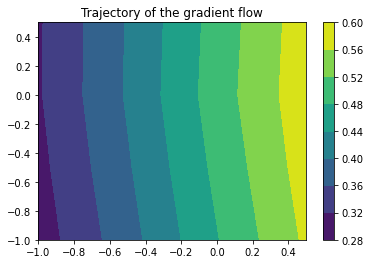

In [152]:
i = 1
x_range = 1.
y_range = x_range
delta = 0.5
grid_x, grid_y = torch.meshgrid(torch.arange(-x_range, x_range, delta), torch.arange(-y_range, y_range, delta))
grid = torch.stack((grid_x.reshape(-1), grid_y.reshape(-1)), dim=1)
model_val = model(plane.embed_tensor(grid)).reshape(grid_x.shape)

trajectory_tensor = torch.stack(trajectory)
trajectory_tensor_proj = plane.project_tensor(trajectory_tensor[:, i, : , :, :])

plt.contourf(grid_x, grid_y, model_val.detach())
plt.colorbar()
#plt.plot(trajectory_tensor_proj[:, 0], trajectory_tensor_proj[:, 1], c='r')
plt.title('Trajectory of the gradient flow')
plt.show()

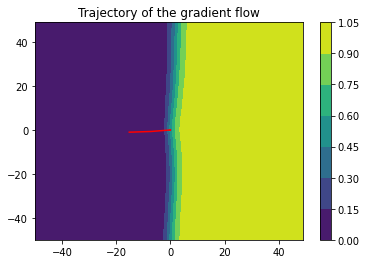

In [148]:
i=1
x_range = 50.
y_range = x_range
delta = 1.
grid_x, grid_y = torch.meshgrid(torch.arange(-x_range, x_range, delta), torch.arange(-y_range, y_range, delta))
grid = torch.stack((grid_x.reshape(-1), grid_y.reshape(-1)), dim=1)
model_val = model(plane.embed_tensor(grid)).reshape(grid_x.shape)

trajectory_tensor = torch.stack(trajectory)
trajectory_tensor_proj = plane.project_tensor(trajectory_tensor[:, i, : , :, :])

plt.contourf(grid_x, grid_y, model_val.detach())
plt.colorbar()
plt.plot(trajectory_tensor_proj[:, 0], trajectory_tensor_proj[:, 1], c='r')
plt.title('Trajectory of the gradient flow')
plt.show()

Don't look at infinitesimal curvature but at curvature on a scale $\varepsilon>0$.

https://numdifftools.readthedocs.io/en/latest/index.html

This approach also works for non-smooth activation functions.